## Requirements and Imports


In [1]:
import copy
import os
from pathlib import Path
from itertools import combinations
from scipy import stats

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
from torch.utils.data import TensorDataset, DataLoader , WeightedRandomSampler

from sklearn.metrics import roc_auc_score , pairwise_distances
import torch
import torch.optim as optim
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
import scipy.sparse as sp
from numba import jit
import squidpy as sq

In [2]:
import models
import metrics
SMALL_SIZE = 14
MEDIUM_SIZE = 19
BIGGER_SIZE = 20
plt.rcParams["font.family"] = "Verdana"
plt.rc('font', size=BIGGER_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=MEDIUM_SIZE)    # legend fontsize
#plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
sc.set_figure_params(scanpy=True, fontsize=19)


In [3]:
adata = sq.datasets.merfish()
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)
adata

AnnData object with n_obs × n_vars = 73642 × 161
    obs: 'Cell_ID', 'Animal_ID', 'Animal_sex', 'Behavior', 'Bregma', 'Centroid_X', 'Centroid_Y', 'Cell_class', 'Neuron_cluster_ID', 'batch', 'n_counts'
    uns: 'Cell_class_colors', 'log1p'
    obsm: 'spatial', 'spatial3d'

In [4]:
adata.obs['Cell_class'].value_counts()

Inhibitory       24761
Excitatory       11757
Ambiguous         9269
Astrocyte         8393
OD Mature 2       5736
Endothelial 1     3799
OD Immature 1     2457
Ependymal         1961
Microglia         1472
Endothelial 3     1369
OD Mature 1        952
Pericytes          638
Endothelial 2      581
OD Mature 4        367
OD Immature 2       91
OD Mature 3         39
Name: Cell_class, dtype: int64

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


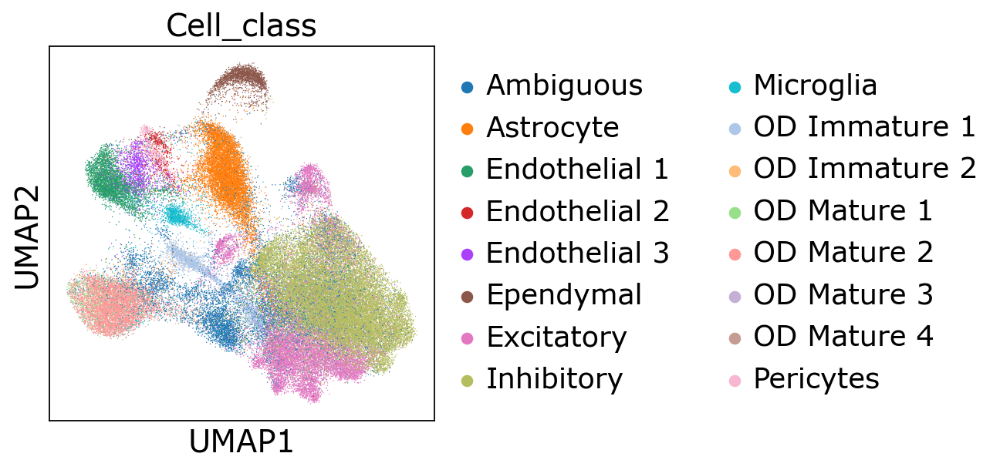

In [5]:
import squidpy as sq
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.pl.umap(adata,color='Cell_class')

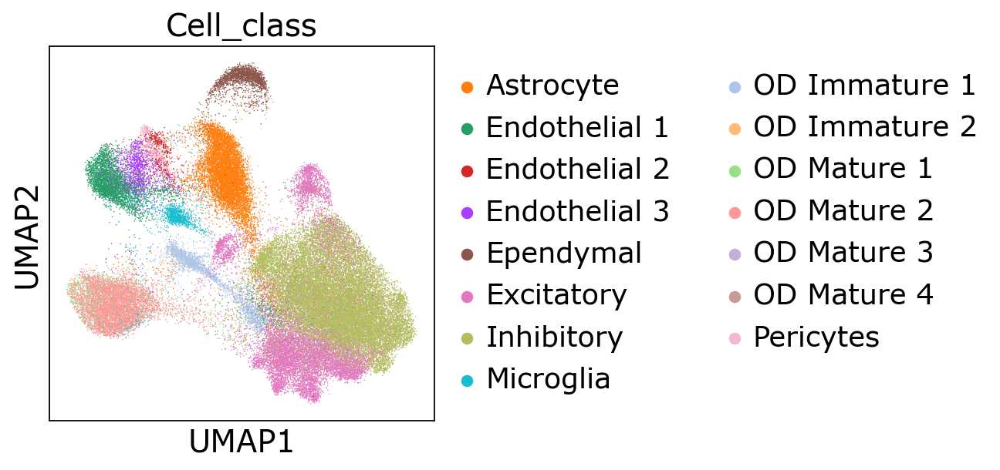

/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


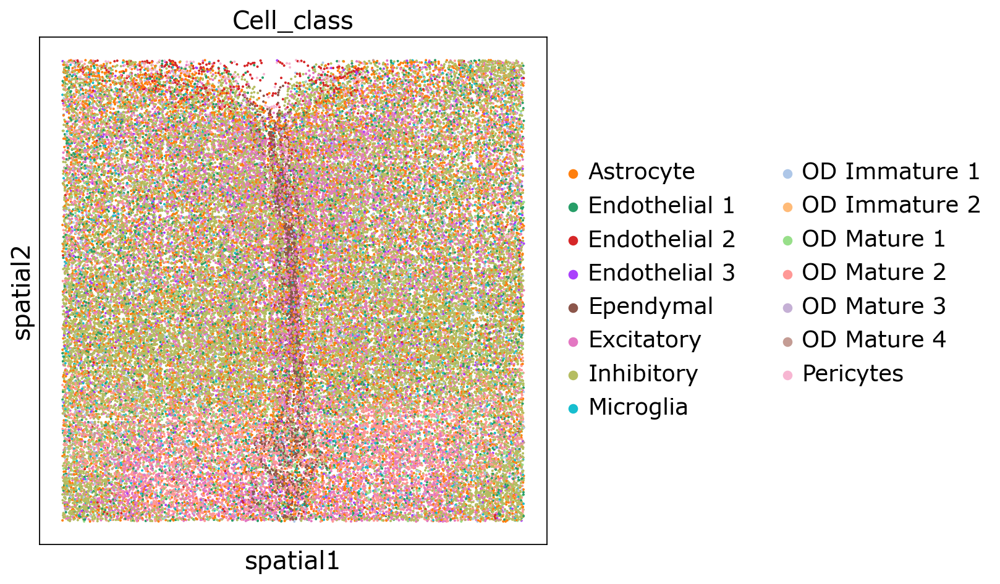

In [6]:
adata= adata[adata.obs['Cell_class'].isin(['OD Mature 2',
 'OD Immature 1',
 'Inhibitory',
 'Excitatory',
 'Microglia',
 'Astrocyte',
 'Endothelial 2',
 'Endothelial 3',
 'Endothelial 1',
 'OD Mature 1',
 'OD Mature 4',
 'Pericytes',
 'OD Mature 3',
 'Ependymal',
 'OD Immature 2']
)]
sc.pl.umap(adata,color='Cell_class')
sq.pl.spatial_scatter(
    adata, color="Cell_class", shape=None, figsize=(10, 10)
)

In [7]:
import numpy as np

# Define a dictionary to map each cluster to its corresponding cell type
cell_type_mapping = {
    'OD Mature 2': 'OD Mature',
    'OD Immature 1': 'OD Immature',
    'Inhibitory': 'Inhibitory',
    'Excitatory': 'Excitatory',
    'Microglia': 'Microglia',
    'Astrocyte': 'Astrocyte',
    'Endothelial 2': 'Endothelial',
    'Endothelial 3': 'Endothelial',
    'Endothelial 1': 'Endothelial',
    'OD Mature 1': 'OD Mature',
    'OD Mature 4': 'OD Mature',
    'Pericytes': 'Pericytes',
    'OD Mature 3': 'OD Mature',
    'Ependymal': 'Ependymal',
    'OD Immature 2': 'OD Immature'
}

# Create an empty list to store the updated cell types
cell_type_list = []

# Iterate over each cluster and assign the corresponding cell type
for i in range(adata.n_obs):
    cluster_name = adata.obs['Cell_class'][i]
    if cluster_name in cell_type_mapping:
        cell_type_list.append(cell_type_mapping[cluster_name])
    else:
        cell_type_list.append(cluster_name)

# Update the cell type column in the AnnData object
adata.obs['CellType'] = np.array(cell_type_list)


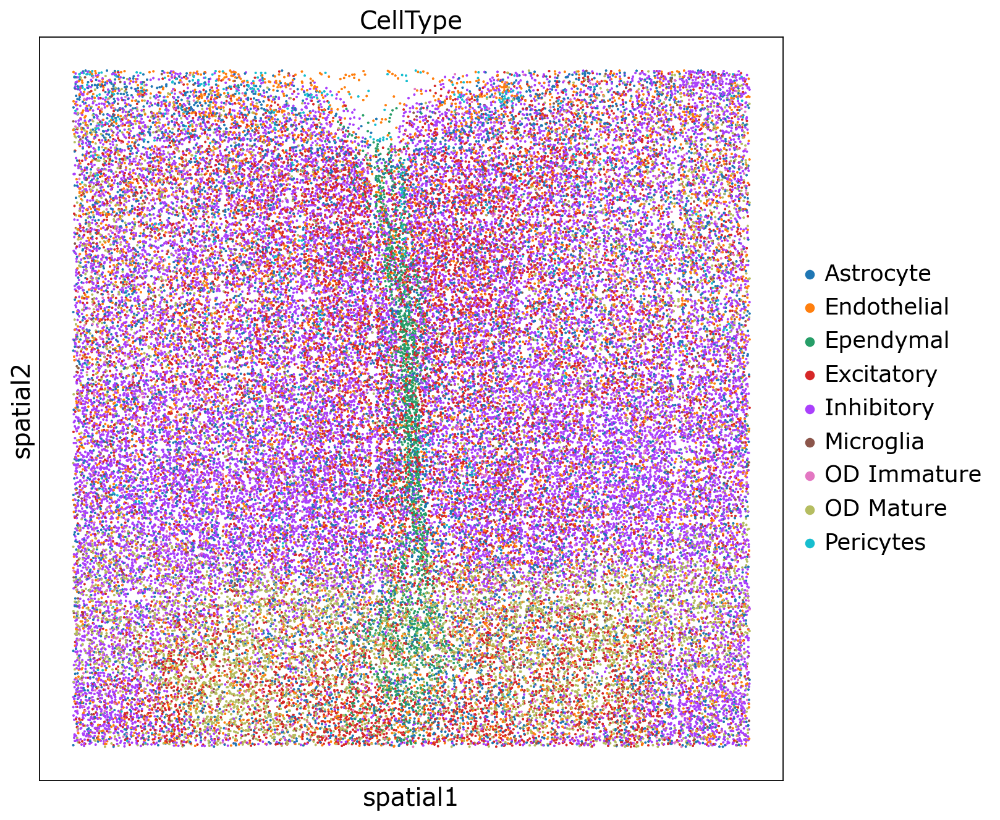

In [8]:
sq.pl.spatial_scatter(
    adata, color="CellType", shape=None, figsize=(10, 10), title='Cell type'
)


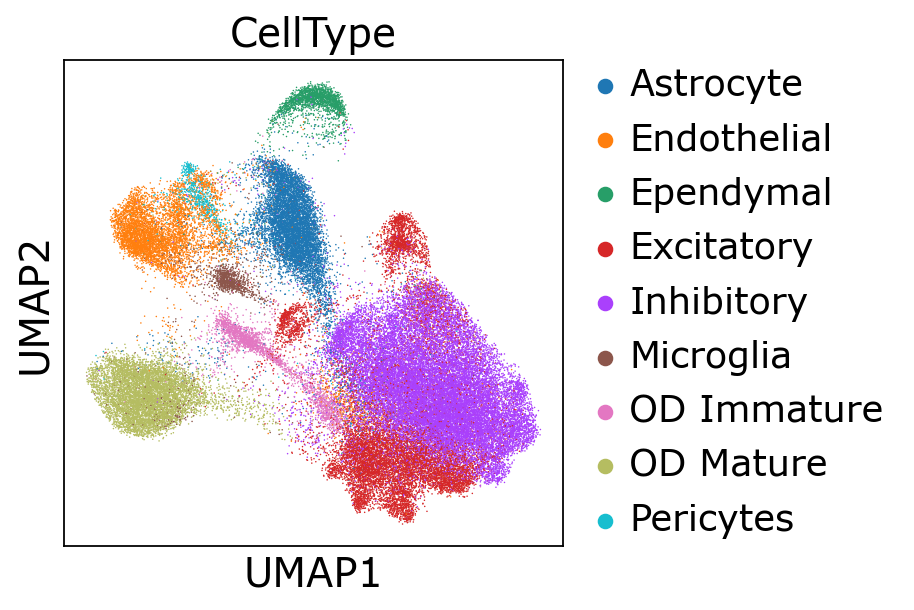

In [9]:
sc.pl.umap(adata,color='CellType', title='Cell type')

In [10]:
len(set(adata.obs['CellType']))

9

In [11]:
adata.obsm['spatial']

array([[0.00906344, 0.08041869],
       [0.03281294, 0.09883481],
       [0.04015782, 0.07502649],
       ...,
       [0.93928628, 0.88763104],
       [0.97045268, 0.88984304],
       [0.99918989, 0.94175804]])

In [12]:
epoch_num=20
prob_list = models.follow_training_dyn_neural_net(adata, label_key='CellType',iterNum=epoch_num, device=device, batch_size=64)
all_conf , all_var = models.probability_list_to_confidence_and_var(prob_list, n_obs= adata.n_obs, epoch_num=epoch_num)
adata.obs["var"] = all_var.detach().numpy()
adata.obs["conf"] = all_conf.detach().numpy()



/Users/jonathankarin/PycharmProjects/training_dyn/models.py:51: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.log_softmax(x)


[1,     2] loss: 0.458
[1,    12] loss: 2.258
[1,    22] loss: 2.186
[1,    32] loss: 2.128
[1,    42] loss: 2.065
[1,    52] loss: 1.998
[1,    62] loss: 1.912
[1,    72] loss: 1.844
[1,    82] loss: 1.777
[1,    92] loss: 1.682
[1,   102] loss: 1.585
[1,   112] loss: 1.446
[1,   122] loss: 1.373
[1,   132] loss: 1.258
[1,   142] loss: 1.169
[1,   152] loss: 1.072
[1,   162] loss: 0.975
[1,   172] loss: 0.922
[1,   182] loss: 0.805
[1,   192] loss: 0.764
[1,   202] loss: 0.737
[1,   212] loss: 0.696
[1,   222] loss: 0.607
[1,   232] loss: 0.611
[1,   242] loss: 0.583
[1,   252] loss: 0.531
[1,   262] loss: 0.561
[1,   272] loss: 0.493
[1,   282] loss: 0.493
[1,   292] loss: 0.450
[1,   302] loss: 0.434
[1,   312] loss: 0.431
[1,   322] loss: 0.443
[1,   332] loss: 0.403
[1,   342] loss: 0.448
[1,   352] loss: 0.403
[1,   362] loss: 0.371
[1,   372] loss: 0.395
[1,   382] loss: 0.358
[1,   392] loss: 0.396
[1,   402] loss: 0.357
[1,   412] loss: 0.363
[1,   422] loss: 0.353
[1,   432] 

[4,   602] loss: 0.162
[4,   612] loss: 0.158
[4,   622] loss: 0.197
[4,   632] loss: 0.193
[4,   642] loss: 0.183
[4,   652] loss: 0.186
[4,   662] loss: 0.182
[4,   672] loss: 0.176
[4,   682] loss: 0.189
[4,   692] loss: 0.186
[4,   702] loss: 0.180
[4,   712] loss: 0.159
[4,   722] loss: 0.220
[4,   732] loss: 0.163
[4,   742] loss: 0.190
[4,   752] loss: 0.142
[4,   762] loss: 0.196
[4,   772] loss: 0.123
[4,   782] loss: 0.216
[4,   792] loss: 0.168
[4,   802] loss: 0.184
[4,   812] loss: 0.168
[4,   822] loss: 0.143
[4,   832] loss: 0.288
[4,   842] loss: 0.171
[4,   852] loss: 0.187
[4,   862] loss: 0.240
[4,   872] loss: 0.200
[4,   882] loss: 0.199
[4,   892] loss: 0.207
[4,   902] loss: 0.227
[4,   912] loss: 0.185
[4,   922] loss: 0.157
[4,   932] loss: 0.204
[4,   942] loss: 0.205
[4,   952] loss: 0.235
[4,   962] loss: 0.162
[4,   972] loss: 0.175
[4,   982] loss: 0.193
[4,   992] loss: 0.173
[4,  1002] loss: 0.158
[5,     2] loss: 0.020
[5,    12] loss: 0.160
[5,    22] 

[8,   232] loss: 0.228
[8,   242] loss: 0.167
[8,   252] loss: 0.130
[8,   262] loss: 0.151
[8,   272] loss: 0.175
[8,   282] loss: 0.153
[8,   292] loss: 0.170
[8,   302] loss: 0.172
[8,   312] loss: 0.194
[8,   322] loss: 0.115
[8,   332] loss: 0.121
[8,   342] loss: 0.134
[8,   352] loss: 0.214
[8,   362] loss: 0.199
[8,   372] loss: 0.143
[8,   382] loss: 0.194
[8,   392] loss: 0.149
[8,   402] loss: 0.155
[8,   412] loss: 0.145
[8,   422] loss: 0.162
[8,   432] loss: 0.173
[8,   442] loss: 0.147
[8,   452] loss: 0.162
[8,   462] loss: 0.167
[8,   472] loss: 0.161
[8,   482] loss: 0.232
[8,   492] loss: 0.134
[8,   502] loss: 0.146
[8,   512] loss: 0.150
[8,   522] loss: 0.177
[8,   532] loss: 0.165
[8,   542] loss: 0.176
[8,   552] loss: 0.159
[8,   562] loss: 0.167
[8,   572] loss: 0.209
[8,   582] loss: 0.179
[8,   592] loss: 0.177
[8,   602] loss: 0.135
[8,   612] loss: 0.153
[8,   622] loss: 0.159
[8,   632] loss: 0.156
[8,   642] loss: 0.127
[8,   652] loss: 0.158
[8,   662] 

[11,   832] loss: 0.180
[11,   842] loss: 0.146
[11,   852] loss: 0.155
[11,   862] loss: 0.163
[11,   872] loss: 0.148
[11,   882] loss: 0.159
[11,   892] loss: 0.136
[11,   902] loss: 0.160
[11,   912] loss: 0.104
[11,   922] loss: 0.143
[11,   932] loss: 0.164
[11,   942] loss: 0.160
[11,   952] loss: 0.127
[11,   962] loss: 0.206
[11,   972] loss: 0.175
[11,   982] loss: 0.156
[11,   992] loss: 0.131
[11,  1002] loss: 0.168
[12,     2] loss: 0.032
[12,    12] loss: 0.168
[12,    22] loss: 0.136
[12,    32] loss: 0.199
[12,    42] loss: 0.165
[12,    52] loss: 0.166
[12,    62] loss: 0.136
[12,    72] loss: 0.189
[12,    82] loss: 0.153
[12,    92] loss: 0.190
[12,   102] loss: 0.186
[12,   112] loss: 0.177
[12,   122] loss: 0.125
[12,   132] loss: 0.168
[12,   142] loss: 0.148
[12,   152] loss: 0.152
[12,   162] loss: 0.129
[12,   172] loss: 0.132
[12,   182] loss: 0.145
[12,   192] loss: 0.129
[12,   202] loss: 0.145
[12,   212] loss: 0.147
[12,   222] loss: 0.171
[12,   232] loss

[15,   372] loss: 0.175
[15,   382] loss: 0.148
[15,   392] loss: 0.147
[15,   402] loss: 0.188
[15,   412] loss: 0.144
[15,   422] loss: 0.127
[15,   432] loss: 0.167
[15,   442] loss: 0.113
[15,   452] loss: 0.137
[15,   462] loss: 0.114
[15,   472] loss: 0.133
[15,   482] loss: 0.160
[15,   492] loss: 0.118
[15,   502] loss: 0.147
[15,   512] loss: 0.153
[15,   522] loss: 0.120
[15,   532] loss: 0.120
[15,   542] loss: 0.163
[15,   552] loss: 0.109
[15,   562] loss: 0.163
[15,   572] loss: 0.123
[15,   582] loss: 0.165
[15,   592] loss: 0.113
[15,   602] loss: 0.152
[15,   612] loss: 0.146
[15,   622] loss: 0.150
[15,   632] loss: 0.139
[15,   642] loss: 0.131
[15,   652] loss: 0.150
[15,   662] loss: 0.155
[15,   672] loss: 0.139
[15,   682] loss: 0.139
[15,   692] loss: 0.121
[15,   702] loss: 0.132
[15,   712] loss: 0.147
[15,   722] loss: 0.160
[15,   732] loss: 0.155
[15,   742] loss: 0.178
[15,   752] loss: 0.160
[15,   762] loss: 0.171
[15,   772] loss: 0.097
[15,   782] loss

[18,   802] loss: 0.140
[18,   812] loss: 0.130
[18,   822] loss: 0.093
[18,   832] loss: 0.126
[18,   842] loss: 0.110
[18,   852] loss: 0.141
[18,   862] loss: 0.107
[18,   872] loss: 0.142
[18,   882] loss: 0.161
[18,   892] loss: 0.153
[18,   902] loss: 0.104
[18,   912] loss: 0.147
[18,   922] loss: 0.140
[18,   932] loss: 0.108
[18,   942] loss: 0.119
[18,   952] loss: 0.127
[18,   962] loss: 0.100
[18,   972] loss: 0.114
[18,   982] loss: 0.179
[18,   992] loss: 0.132
[18,  1002] loss: 0.119
[19,     2] loss: 0.041
[19,    12] loss: 0.128
[19,    22] loss: 0.102
[19,    32] loss: 0.105
[19,    42] loss: 0.097
[19,    52] loss: 0.156
[19,    62] loss: 0.102
[19,    72] loss: 0.096
[19,    82] loss: 0.122
[19,    92] loss: 0.116
[19,   102] loss: 0.099
[19,   112] loss: 0.133
[19,   122] loss: 0.145
[19,   132] loss: 0.146
[19,   142] loss: 0.123
[19,   152] loss: 0.128
[19,   162] loss: 0.127
[19,   172] loss: 0.162
[19,   182] loss: 0.154
[19,   192] loss: 0.128
[19,   202] loss

In [13]:
cutoff_conf , cutoff_var = models.find_cutoff_paramter(adata,'CellType',device,probability=0.05,percentile=90,epoch_num=epoch_num)
cutoff_conf , cutoff_var

/Users/jonathankarin/PycharmProjects/training_dyn/models.py:51: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.log_softmax(x)


[1,     2] loss: 0.440
[1,    12] loss: 2.200
[1,    22] loss: 2.168
[1,    32] loss: 2.144
[1,    42] loss: 2.106
[1,    52] loss: 2.069
[1,    62] loss: 2.035
[1,    72] loss: 1.982
[1,    82] loss: 1.945
[1,    92] loss: 1.901
[1,   102] loss: 1.841
[1,   112] loss: 1.789
[1,   122] loss: 1.748
[1,   132] loss: 1.661
[1,   142] loss: 1.607
[1,   152] loss: 1.565
[1,   162] loss: 1.500
[1,   172] loss: 1.466
[1,   182] loss: 1.409
[1,   192] loss: 1.403
[1,   202] loss: 1.351
[1,   212] loss: 1.307
[1,   222] loss: 1.264
[1,   232] loss: 1.214
[1,   242] loss: 1.204
[1,   252] loss: 1.186
[2,     2] loss: 0.232
[2,    12] loss: 1.170
[2,    22] loss: 1.121
[2,    32] loss: 1.095
[2,    42] loss: 1.074
[2,    52] loss: 1.015
[2,    62] loss: 1.050
[2,    72] loss: 1.017
[2,    82] loss: 1.021
[2,    92] loss: 0.983
[2,   102] loss: 0.990
[2,   112] loss: 1.000
[2,   122] loss: 0.965
[2,   132] loss: 0.939
[2,   142] loss: 0.937
[2,   152] loss: 0.936
[2,   162] loss: 0.929
[2,   172] 

[14,   192] loss: 0.750
[14,   202] loss: 0.732
[14,   212] loss: 0.785
[14,   222] loss: 0.699
[14,   232] loss: 0.729
[14,   242] loss: 0.768
[14,   252] loss: 0.724
[15,     2] loss: 0.142
[15,    12] loss: 0.718
[15,    22] loss: 0.726
[15,    32] loss: 0.733
[15,    42] loss: 0.662
[15,    52] loss: 0.698
[15,    62] loss: 0.699
[15,    72] loss: 0.702
[15,    82] loss: 0.690
[15,    92] loss: 0.755
[15,   102] loss: 0.722
[15,   112] loss: 0.685
[15,   122] loss: 0.736
[15,   132] loss: 0.727
[15,   142] loss: 0.707
[15,   152] loss: 0.699
[15,   162] loss: 0.707
[15,   172] loss: 0.693
[15,   182] loss: 0.695
[15,   192] loss: 0.675
[15,   202] loss: 0.691
[15,   212] loss: 0.742
[15,   222] loss: 0.686
[15,   232] loss: 0.695
[15,   242] loss: 0.749
[15,   252] loss: 0.768
[16,     2] loss: 0.153
[16,    12] loss: 0.756
[16,    22] loss: 0.716
[16,    32] loss: 0.679
[16,    42] loss: 0.737
[16,    52] loss: 0.662
[16,    62] loss: 0.705
[16,    72] loss: 0.693
[16,    82] loss

(0.11846035867929484, 0.04215526953339577)

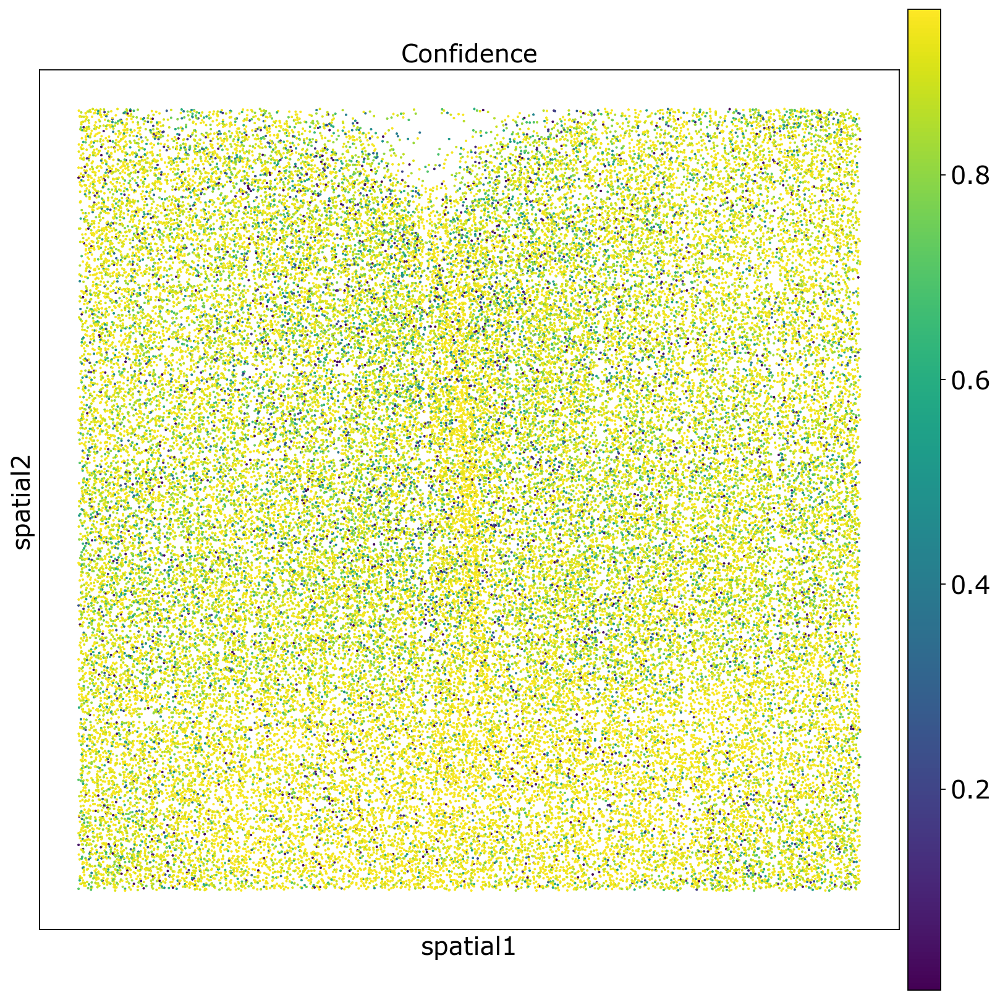

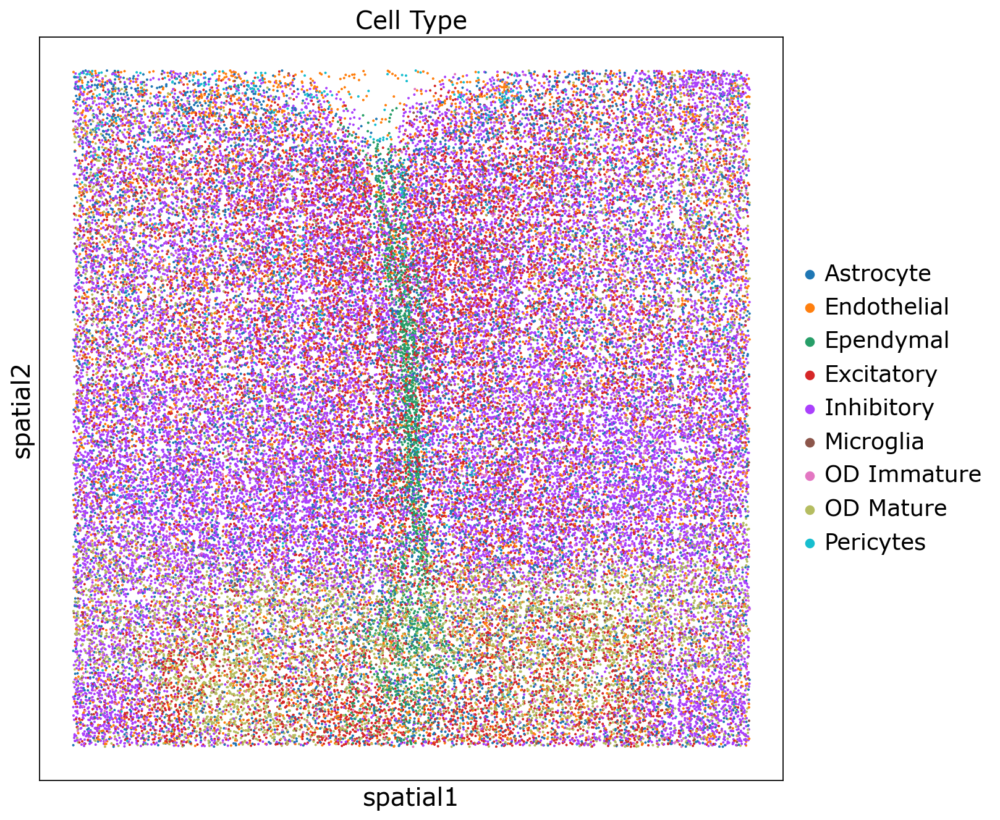

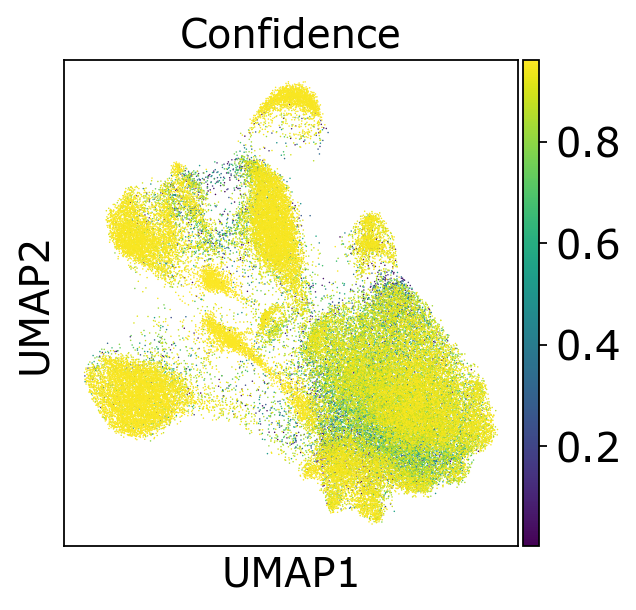

In [14]:
sq.pl.spatial_scatter(
    adata, color=['conf'], shape=None, figsize=(10, 10), title='Confidence',
)
sq.pl.spatial_scatter(
    adata, color=["CellType"], shape=None, figsize=(10, 10),   title='Cell type',
)
sc.pl.umap(adata,color=['conf'], title='Confidence')

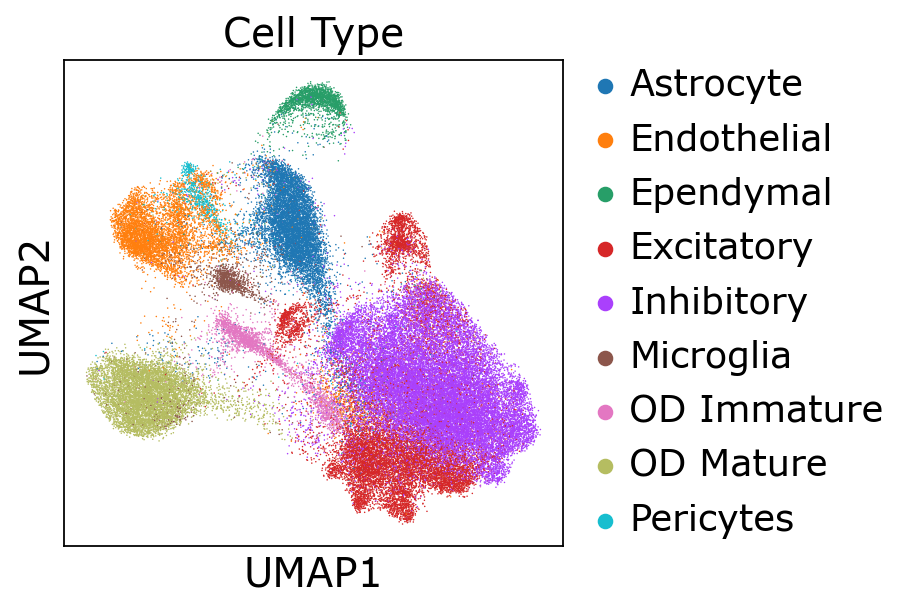

In [15]:
sc.pl.umap(adata,color=["CellType"],   title='Cell type')


/var/folders/yk/yt973zks3y50tkwcqhndwqrm0000gn/T/ipykernel_5426/1574983548.py:4: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.hist2d(adata.obs['var'], adata.obs['conf'], bins=250, cmap='BuGn',norm=matplotlib.colors.LogNorm())
/var/folders/yk/yt973zks3y50tkwcqhndwqrm0000gn/T/ipykernel_5426/1574983548.py:7: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar()


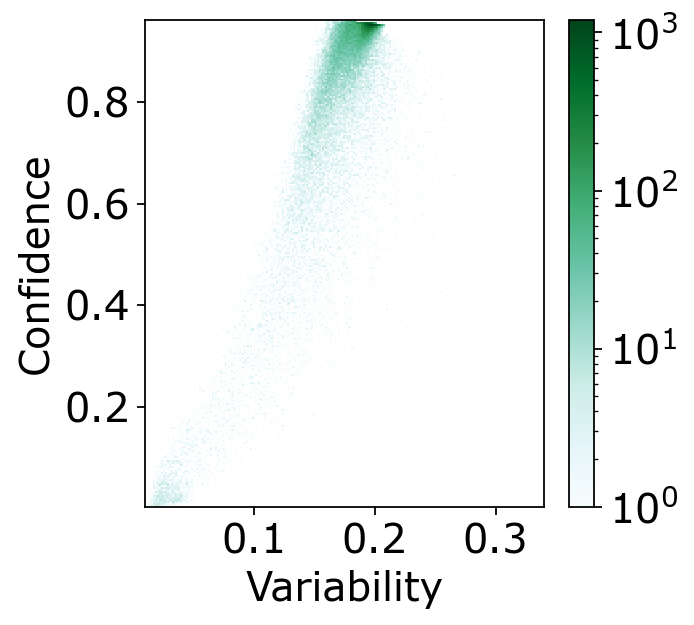

In [52]:
import matplotlib
plt.xlim([0,1])
plt.ylim([0,1])
plt.hist2d(adata.obs['var'], adata.obs['conf'], bins=250, cmap='BuGn',norm=matplotlib.colors.LogNorm())
plt.xlabel('Variability')
plt.ylabel('Confidence')
plt.colorbar()

In [17]:
adata.obs['conf_binaries'] = pd.Categorical((adata.obs['conf'] > cutoff_conf) | (adata.obs['var'] > cutoff_var))

adata.obs['conf_binaries'].value_counts()

True     63235
False     1138
Name: conf_binaries, dtype: int64

In [18]:

marker_genes_dict = {'Inhibitory neurons':['Gad1'],#, 'Gad2', 'Slc32a1'],
                     'Excitatory neurons': ['Slc17a6'],
                     'Pericytes':['Myh11'],
                     'Endothelial':['Fn1'],
                     'Ependymal':['Cd24a'],
                     'Microglia':['Selplg'],
                     'Astrocytes': ['Aqp4'],
                     'OD Immature': ['Pdgfra'],
                     'OD Mature':['Ttyh2','Mbp']}


marker_genes_list = ['Gad1','Slc17a6',
                     'Myh11',
                     'Fn1',
                     'Cd24a',
                     'Selplg',
                     'Aqp4',
                     'Pdgfra',
                     'Ttyh2','Mbp']



In [19]:
corr_classified_list =[]
for i in range(adata.n_obs):
    if adata.obs['conf_binaries'][i]==True:
        corr_classified_list.append('Correct annotation')
    else: 
        corr_classified_list.append('Erroneous annotation')
adata.obs['annotation']=corr_classified_list
bdata = adata.copy()

sc.pp.scale(bdata)


OD Mature


/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


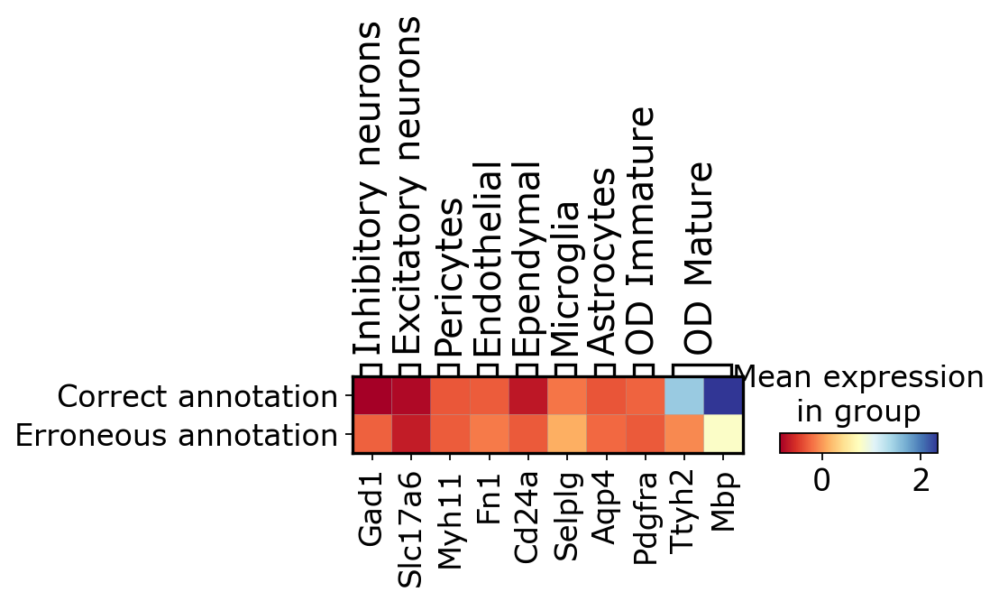

Correct annotation      7063
Erroneous annotation      31
Name: annotation, dtype: int64
OD Immature


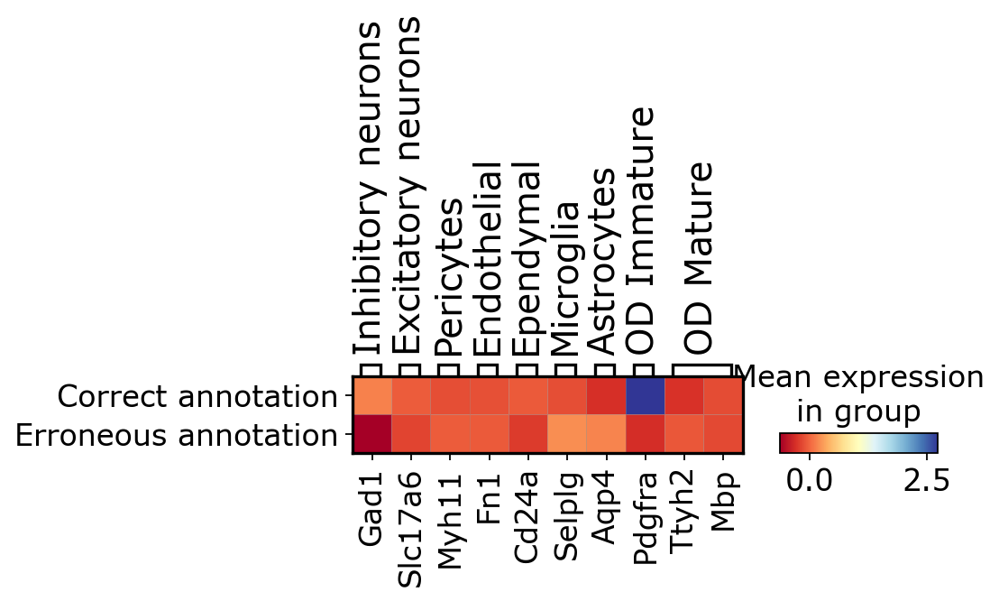

Correct annotation      2504
Erroneous annotation      44
Name: annotation, dtype: int64
Inhibitory


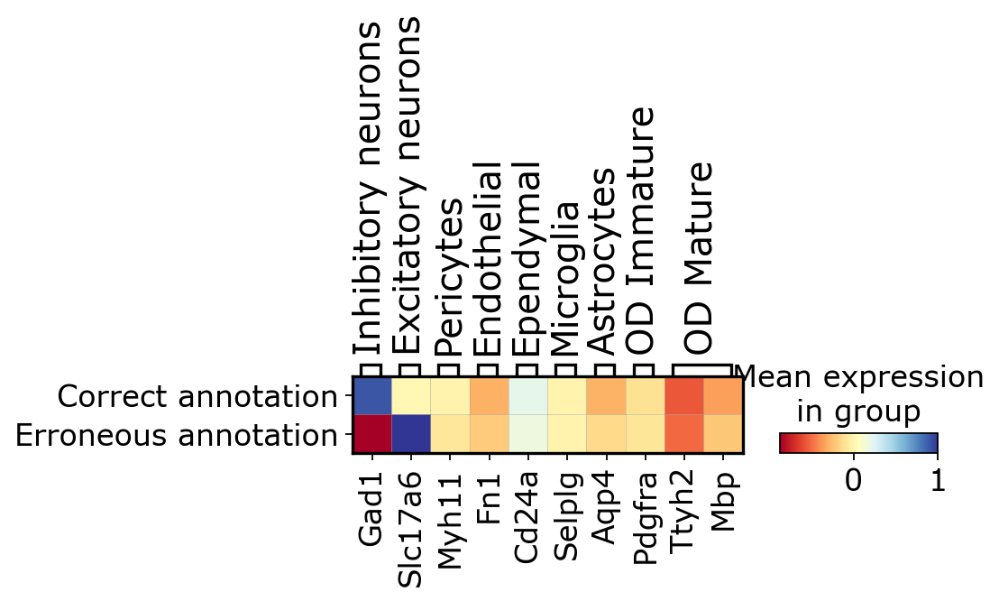

Correct annotation      24174
Erroneous annotation      587
Name: annotation, dtype: int64
Excitatory


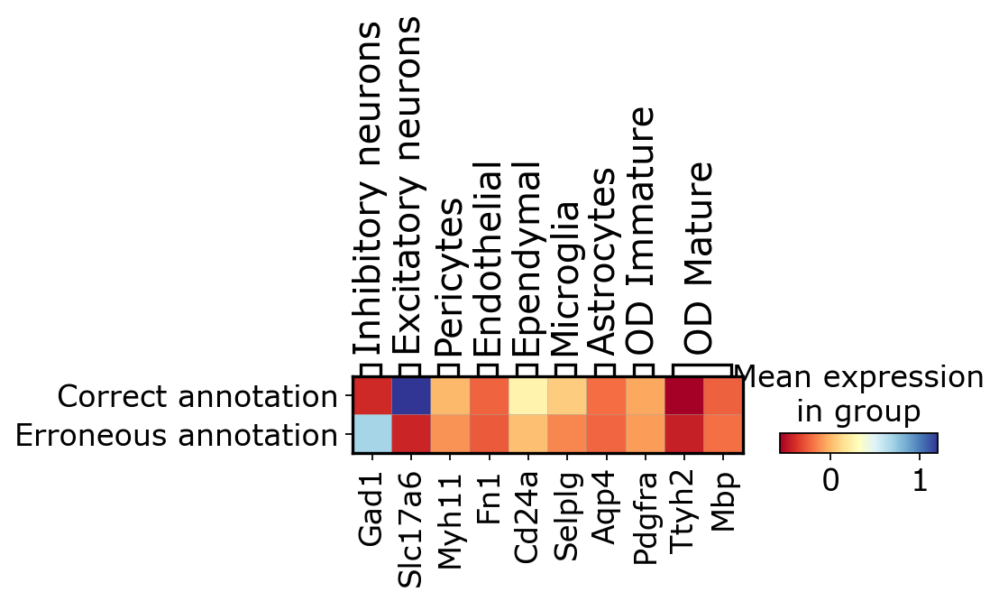

Correct annotation      11443
Erroneous annotation      314
Name: annotation, dtype: int64
Microglia


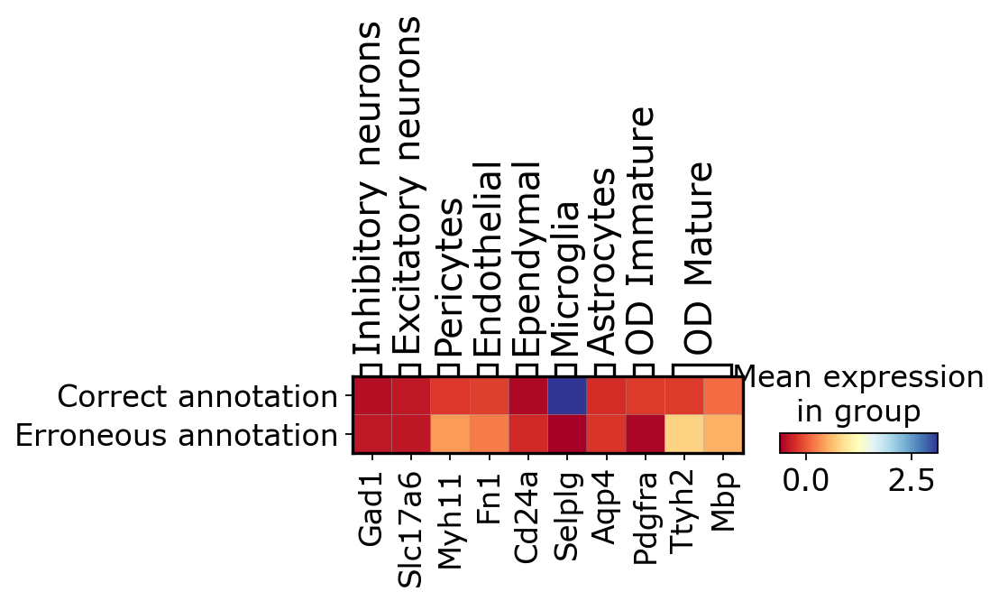

Correct annotation      1464
Erroneous annotation       8
Name: annotation, dtype: int64
Astrocyte


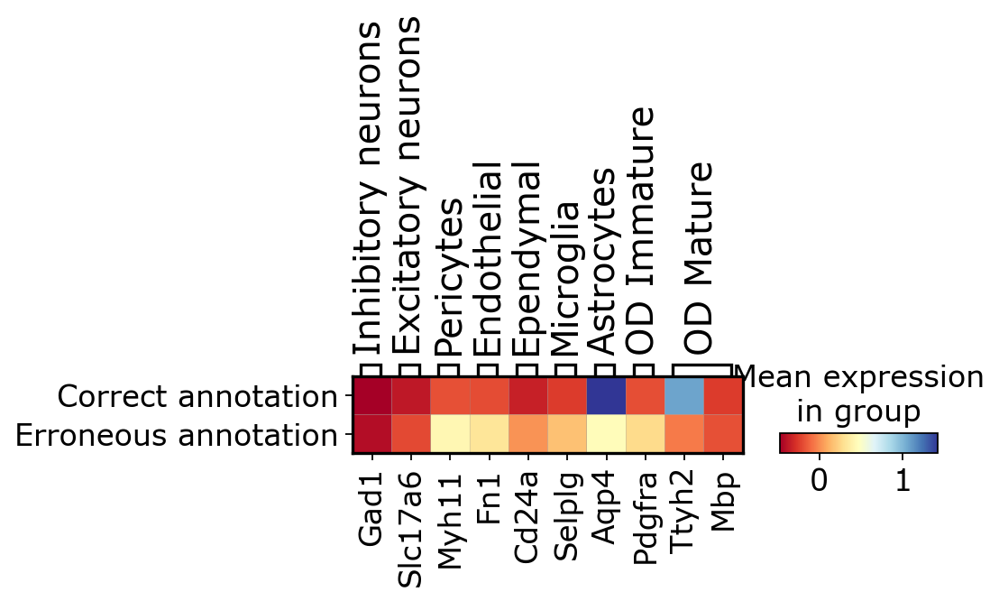

Correct annotation      8316
Erroneous annotation      77
Name: annotation, dtype: int64
Endothelial


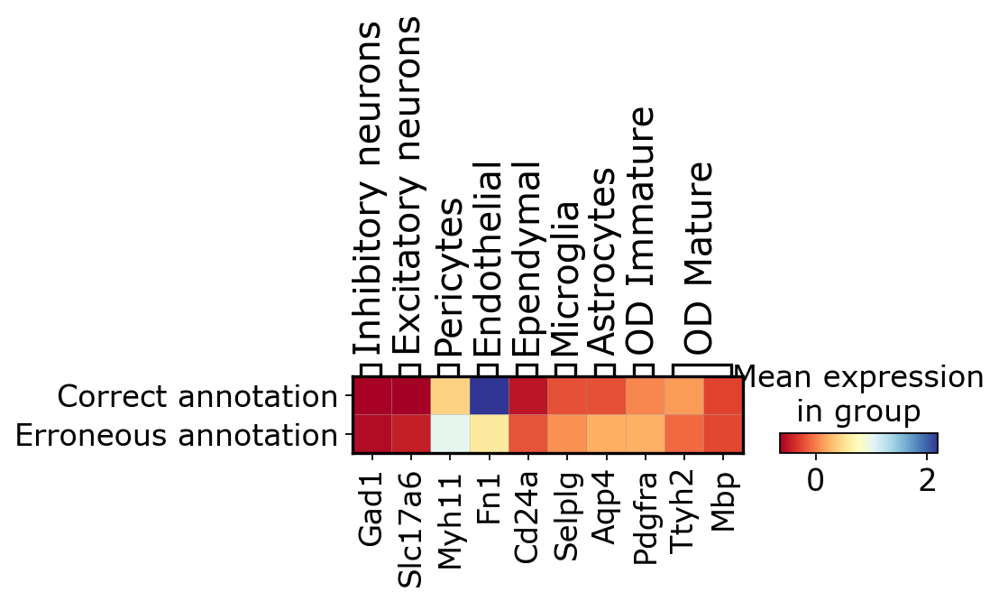

Correct annotation      5673
Erroneous annotation      76
Name: annotation, dtype: int64
Pericytes


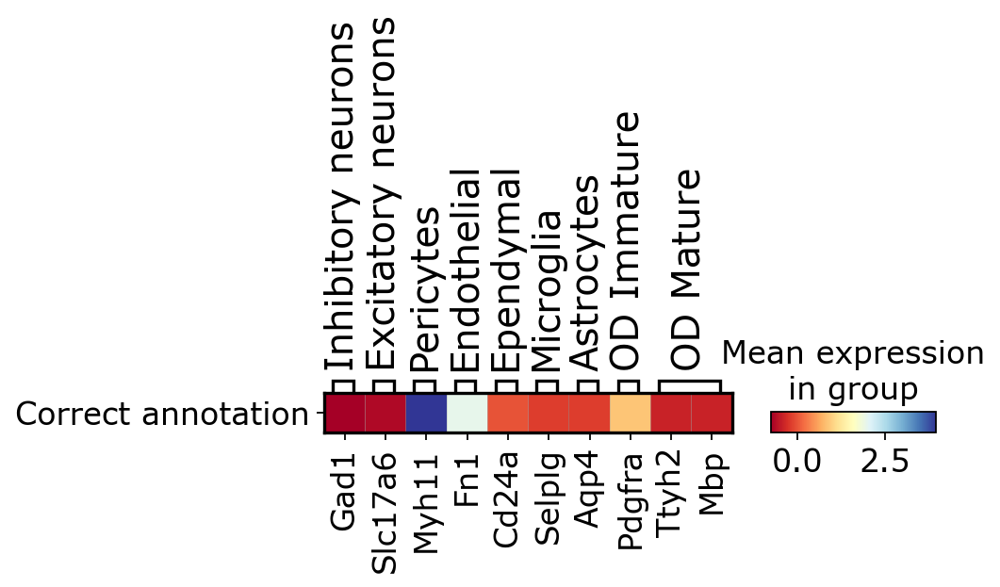

Correct annotation    638
Name: annotation, dtype: int64
Ependymal


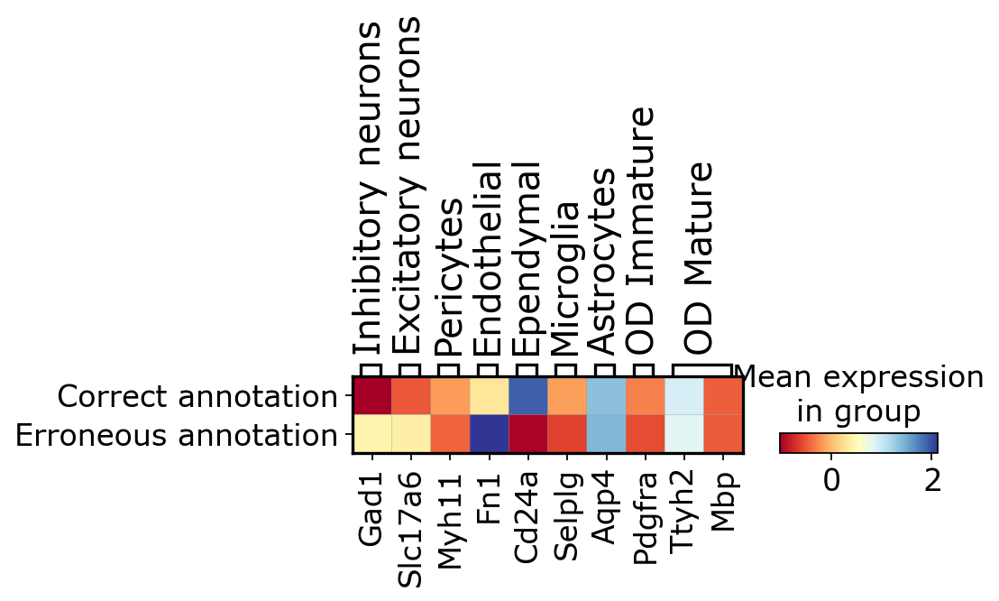

Correct annotation      1960
Erroneous annotation       1
Name: annotation, dtype: int64


In [20]:
celltype_list = adata.obs['CellType'].unique()
for celltype in celltype_list:
    print(celltype)
    adata_tmp= bdata[bdata.obs['CellType'].isin([celltype])]
    ax = sc.pl.matrixplot(adata_tmp, marker_genes_dict, groupby='annotation', cmap='RdYlBu')
    print(adata_tmp.obs['annotation'].value_counts())

In [21]:
bdata= adata[adata.obs['conf_binaries'].isin([True])]
cdata= bdata.copy()
sc.pp.scale(cdata)

In [22]:
hdata = models.predict_true_labels(adata, label='CellType', device=device, epoch_num=20)

/Users/jonathankarin/PycharmProjects/training_dyn/models.py:51: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.log_softmax(x)


[1,     2] loss: 0.447
[1,    12] loss: 2.209
[1,    22] loss: 2.158
[1,    32] loss: 2.097
[1,    42] loss: 2.060
[1,    52] loss: 1.990
[1,    62] loss: 1.932
[1,    72] loss: 1.869
[1,    82] loss: 1.794
[1,    92] loss: 1.724
[1,   102] loss: 1.623
[1,   112] loss: 1.543
[1,   122] loss: 1.446
[1,   132] loss: 1.320
[1,   142] loss: 1.226
[1,   152] loss: 1.126
[1,   162] loss: 1.011
[1,   172] loss: 0.937
[1,   182] loss: 0.851
[1,   192] loss: 0.770
[1,   202] loss: 0.713
[1,   212] loss: 0.681
[1,   222] loss: 0.624
[1,   232] loss: 0.569
[1,   242] loss: 0.566
[2,     2] loss: 0.102
[2,    12] loss: 0.517
[2,    22] loss: 0.499
[2,    32] loss: 0.464
[2,    42] loss: 0.453
[2,    52] loss: 0.448
[2,    62] loss: 0.428
[2,    72] loss: 0.436
[2,    82] loss: 0.409
[2,    92] loss: 0.388
[2,   102] loss: 0.405
[2,   112] loss: 0.375
[2,   122] loss: 0.356
[2,   132] loss: 0.364
[2,   142] loss: 0.357
[2,   152] loss: 0.335
[2,   162] loss: 0.334
[2,   172] loss: 0.338
[2,   182] 

[15,    82] loss: 0.123
[15,    92] loss: 0.117
[15,   102] loss: 0.128
[15,   112] loss: 0.125
[15,   122] loss: 0.123
[15,   132] loss: 0.116
[15,   142] loss: 0.120
[15,   152] loss: 0.118
[15,   162] loss: 0.116
[15,   172] loss: 0.123
[15,   182] loss: 0.119
[15,   192] loss: 0.142
[15,   202] loss: 0.130
[15,   212] loss: 0.132
[15,   222] loss: 0.125
[15,   232] loss: 0.137
[15,   242] loss: 0.140
[16,     2] loss: 0.033
[16,    12] loss: 0.131
[16,    22] loss: 0.122
[16,    32] loss: 0.111
[16,    42] loss: 0.122
[16,    52] loss: 0.123
[16,    62] loss: 0.124
[16,    72] loss: 0.129
[16,    82] loss: 0.137
[16,    92] loss: 0.125
[16,   102] loss: 0.122
[16,   112] loss: 0.122
[16,   122] loss: 0.111
[16,   132] loss: 0.113
[16,   142] loss: 0.126
[16,   152] loss: 0.110
[16,   162] loss: 0.132
[16,   172] loss: 0.112
[16,   182] loss: 0.129
[16,   192] loss: 0.122
[16,   202] loss: 0.142
[16,   212] loss: 0.135
[16,   222] loss: 0.110
[16,   232] loss: 0.111
[16,   242] loss

In [23]:
hdata

AnnData object with n_obs × n_vars = 64373 × 161
    obs: 'Cell_ID', 'Animal_ID', 'Animal_sex', 'Behavior', 'Bregma', 'Centroid_X', 'Centroid_Y', 'Cell_class', 'Neuron_cluster_ID', 'batch', 'n_counts', 'CellType', 'var', 'conf', 'modified_label', 'conf_binaries', 'annotation', 'CorrectedCellType'
    uns: 'Cell_class_colors', 'log1p', 'pca', 'neighbors', 'umap', 'CellType_colors'
    obsm: 'spatial', 'spatial3d', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [24]:
adata_false_annotation= adata[adata.obs['conf_binaries'].isin([False])]

In [25]:
adata_true_annotation= adata[adata.obs['conf_binaries'].isin([True])]

In [26]:
hdata.obs['changed_anno'] = (hdata.obs['CellType']==hdata.obs['CorrectedCellType'])

In [27]:
adata_did_not_changed= hdata[hdata.obs['changed_anno'].isin([True])]
adata_did_not_changed = adata_did_not_changed[adata_did_not_changed.obs['conf_binaries'].isin([False])]
adata_did_not_changed

View of AnnData object with n_obs × n_vars = 0 × 161
    obs: 'Cell_ID', 'Animal_ID', 'Animal_sex', 'Behavior', 'Bregma', 'Centroid_X', 'Centroid_Y', 'Cell_class', 'Neuron_cluster_ID', 'batch', 'n_counts', 'CellType', 'var', 'conf', 'modified_label', 'conf_binaries', 'annotation', 'CorrectedCellType', 'changed_anno'
    uns: 'Cell_class_colors', 'log1p', 'pca', 'neighbors', 'umap', 'CellType_colors'
    obsm: 'spatial', 'spatial3d', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [28]:
adata_annotation_changed= hdata[hdata.obs['changed_anno'].isin([False])]

In [29]:
adata_annotation_changed

View of AnnData object with n_obs × n_vars = 1138 × 161
    obs: 'Cell_ID', 'Animal_ID', 'Animal_sex', 'Behavior', 'Bregma', 'Centroid_X', 'Centroid_Y', 'Cell_class', 'Neuron_cluster_ID', 'batch', 'n_counts', 'CellType', 'var', 'conf', 'modified_label', 'conf_binaries', 'annotation', 'CorrectedCellType', 'changed_anno'
    uns: 'Cell_class_colors', 'log1p', 'pca', 'neighbors', 'umap', 'CellType_colors'
    obsm: 'spatial', 'spatial3d', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

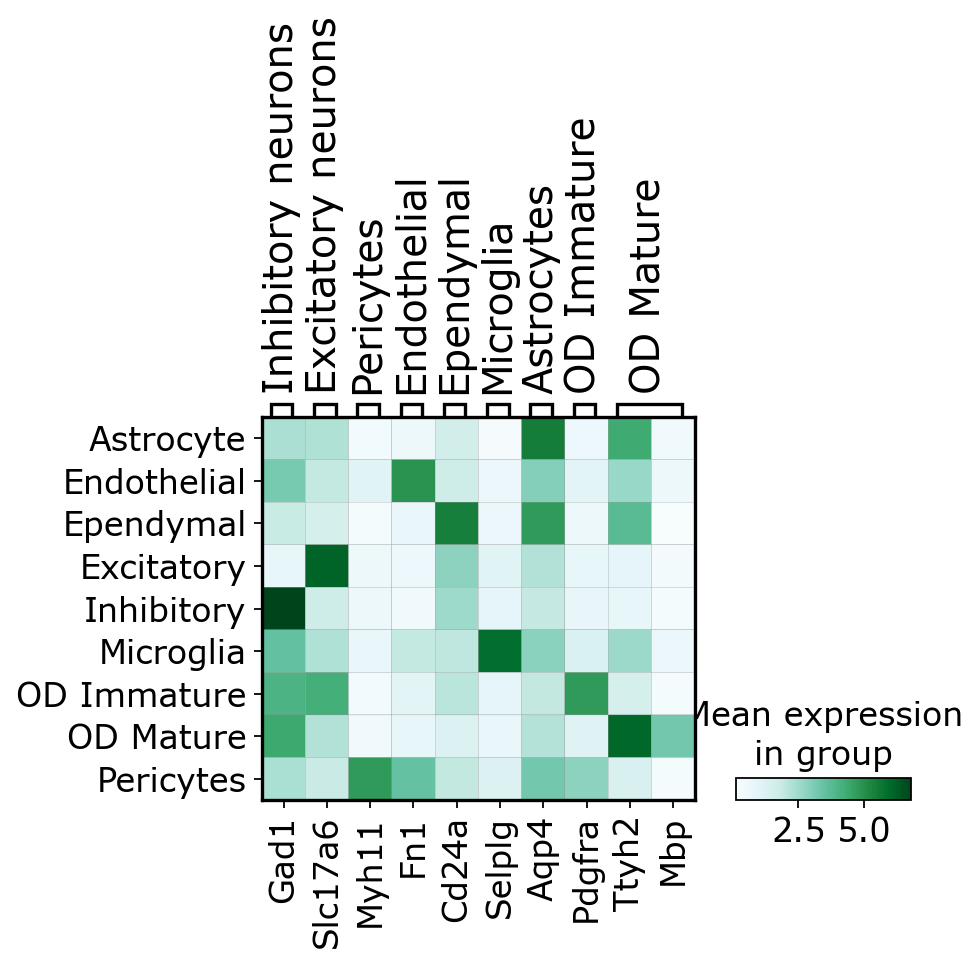

In [30]:
adata_annotation_changed_scaled = adata_annotation_changed.copy()
ax = sc.pl.matrixplot(adata_annotation_changed_scaled, marker_genes_dict, groupby='CorrectedCellType', cmap='BuGn')


/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


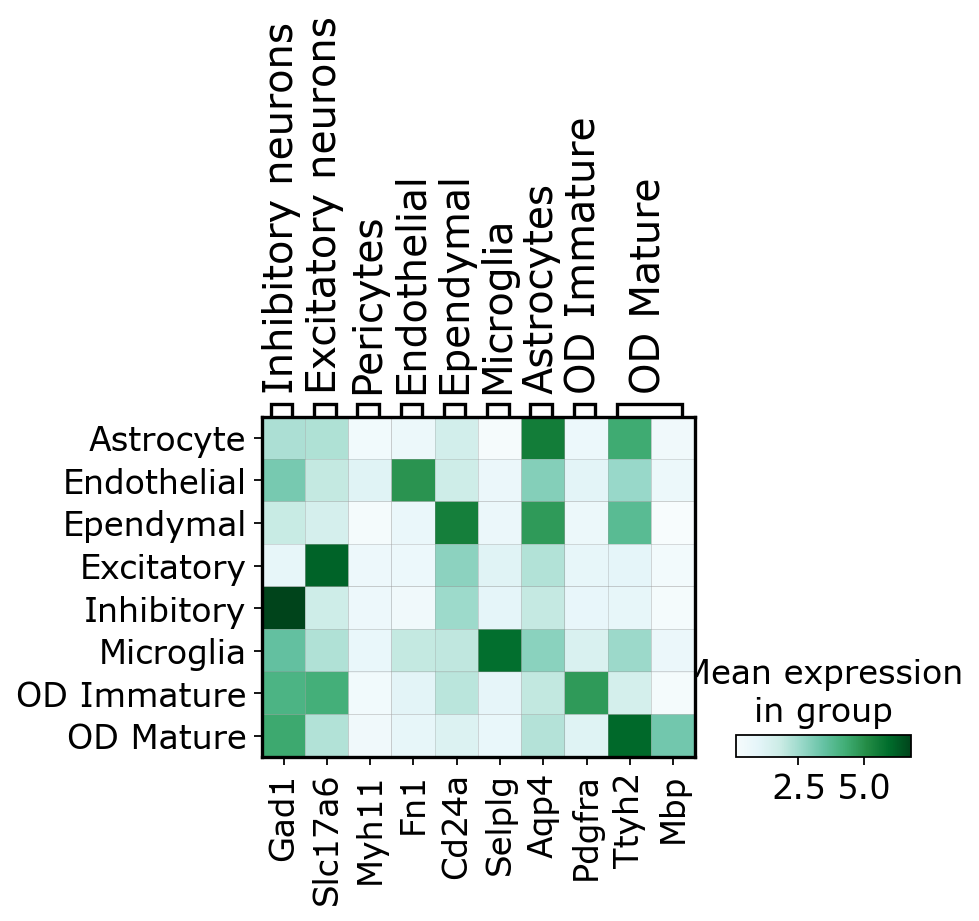

In [31]:
adata_annotation_changed_no_per= adata_annotation_changed[adata_annotation_changed.obs['CorrectedCellType'].isin(['Astrocyte',
                                            'Endothelial', 'Ependymal',
                                            'Excitatory',
                                            'Inhibitory', 'Microglia', 'OD Immature',
                                                                                                         'OD Mature'])]
ax = sc.pl.matrixplot(adata_annotation_changed_no_per, marker_genes_dict, groupby='CorrectedCellType', cmap='BuGn')


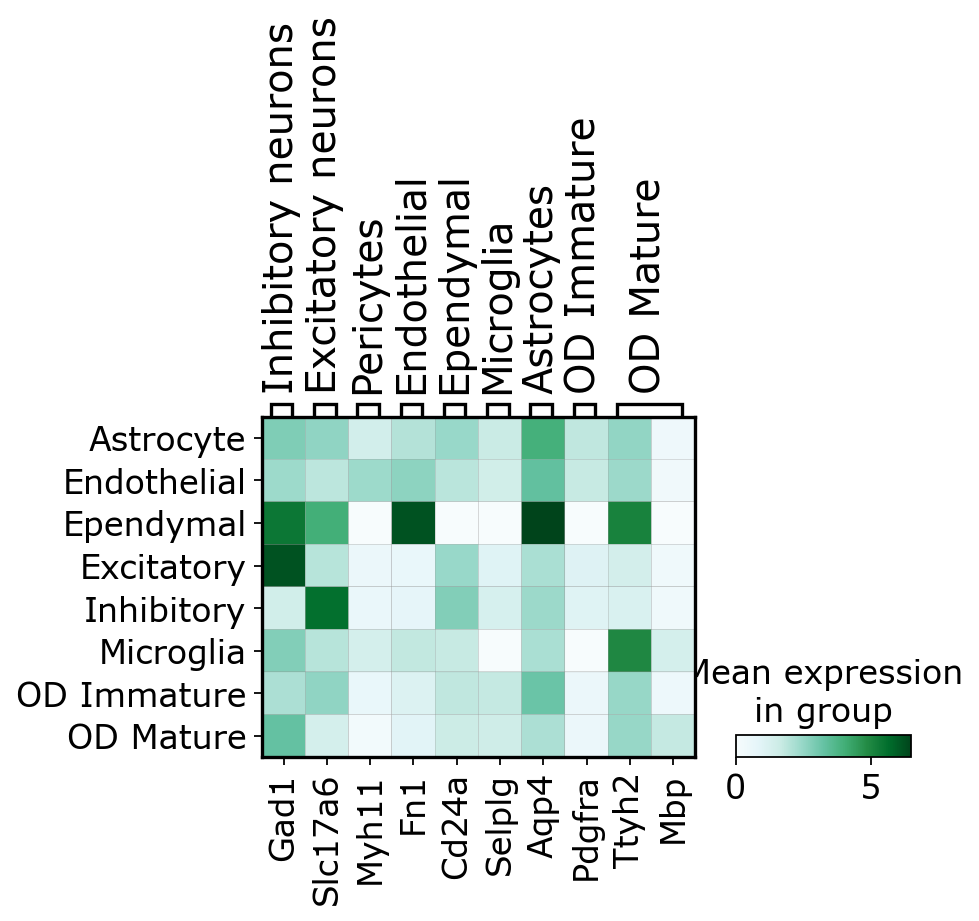

In [32]:
adata_false_annotated= hdata[hdata.obs['conf_binaries'].isin([False])]
ax = sc.pl.matrixplot(adata_false_annotated, marker_genes_dict, groupby='CellType', cmap='BuGn')


/var/folders/yk/yt973zks3y50tkwcqhndwqrm0000gn/T/ipykernel_5426/938036703.py:9: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tmp_tdata2.obs['Celltype_to_corrected'] = False_or_pos
/var/folders/yk/yt973zks3y50tkwcqhndwqrm0000gn/T/ipykernel_5426/938036703.py:35: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tmp_tdata.obs['Celltype_to_corrected'] = Celltype_to_corrected
/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


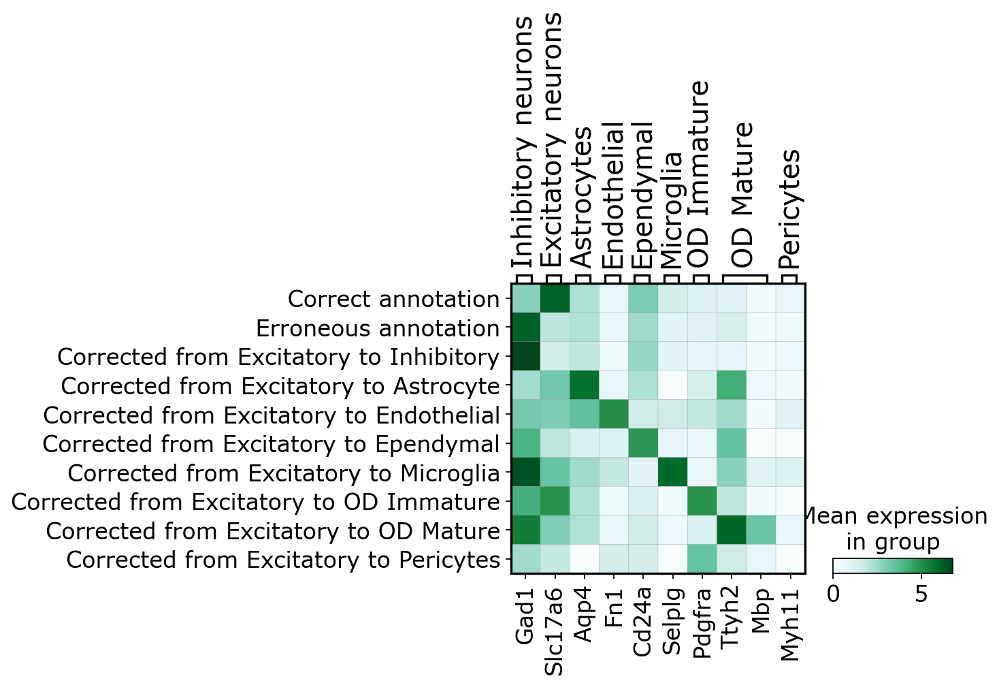

In [58]:
tmp_tdata2 = hdata[hdata.obs['CellType'].isin(['Excitatory'])]
False_or_pos = []
for i in range(tmp_tdata2.n_obs):
    if tmp_tdata2.obs['conf_binaries'][i]:
        False_or_pos.append('  Correct annotation')
    else:
        False_or_pos.append('  Erroneous annotation')

tmp_tdata2.obs['Celltype_to_corrected'] = False_or_pos


Celltype_to_corrected =[]
for i in range(adata_false_annotated.n_obs):
    if adata_false_annotated.obs['CorrectedCellType'][i]=='Inhibitory':
        string = " " +str(adata_false_annotated.obs['CellType'][i]) + "_" + str(adata_false_annotated.obs['CorrectedCellType'][i])
    elif adata_false_annotated.obs['CorrectedCellType'][i]=='Excitatory':
        string = " " +str(adata_false_annotated.obs['CellType'][i]) + "_" + str(adata_false_annotated.obs['CorrectedCellType'][i])
    else:
        string = str(adata_false_annotated.obs['CellType'][i]) + "_" + str(adata_false_annotated.obs['CorrectedCellType'][i])
    Celltype_to_corrected.append(string)
adata_false_annotated.obs['Celltype_to_corrected'] = Celltype_to_corrected

tmp_tdata = adata_false_annotated[adata_false_annotated.obs['CellType'].isin(['Excitatory'])]
Celltype_to_corrected =[]
for i in range(tmp_tdata.n_obs):
        if tmp_tdata.obs['conf_binaries'][i]==False:        
            if tmp_tdata.obs['CorrectedCellType'][i]=='Inhibitory': 
                string = " Corrected from " + str(tmp_tdata.obs['CellType'][i]) + " to " + str(tmp_tdata.obs['CorrectedCellType'][i])
            elif tmp_tdata.obs['CorrectedCellType'][i]=='Excitatory': 
                string = " Corrected from " + str(tmp_tdata.obs['CellType'][i]) + " to " + str(tmp_tdata.obs['CorrectedCellType'][i])
            else:
                string = "Corrected from " + str(tmp_tdata.obs['CellType'][i]) + " to " + str(tmp_tdata.obs['CorrectedCellType'][i])
            Celltype_to_corrected.append(string)

tmp_tdata.obs['Celltype_to_corrected'] = Celltype_to_corrected

marker_genes_dict = {
                     'Inhibitory neurons':['Gad1'],#, 'Gad2', 'Slc32a1'],
                    'Excitatory neurons': ['Slc17a6'],
                     'Astrocytes': ['Aqp4'],
                     'Endothelial':['Fn1'],
                     'Ependymal':['Cd24a'],
                     'Microglia':['Selplg'],
                     'OD Immature': ['Pdgfra'],
                     'OD Mature':['Ttyh2','Mbp'],
                     'Pericytes':['Myh11']}


tmp_tdata3 = tmp_tdata2.concatenate(tmp_tdata)




ax = sc.pl.matrixplot(tmp_tdata3, marker_genes_dict, groupby='Celltype_to_corrected', cmap='BuGn')


In [59]:
tmp_tdata.obs['CorrectedCellType'].value_counts()

Inhibitory     251
Astrocyte       18
OD Mature       12
OD Immature     10
Endothelial      8
Microglia        7
Ependymal        5
Pericytes        3
Name: CorrectedCellType, dtype: int64

/var/folders/yk/yt973zks3y50tkwcqhndwqrm0000gn/T/ipykernel_5426/945680209.py:9: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tmp_tdata2.obs['Celltype_to_corrected'] = False_or_pos
/var/folders/yk/yt973zks3y50tkwcqhndwqrm0000gn/T/ipykernel_5426/945680209.py:30: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tmp_tdata.obs['Celltype_to_corrected'] = Celltype_to_corrected
/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


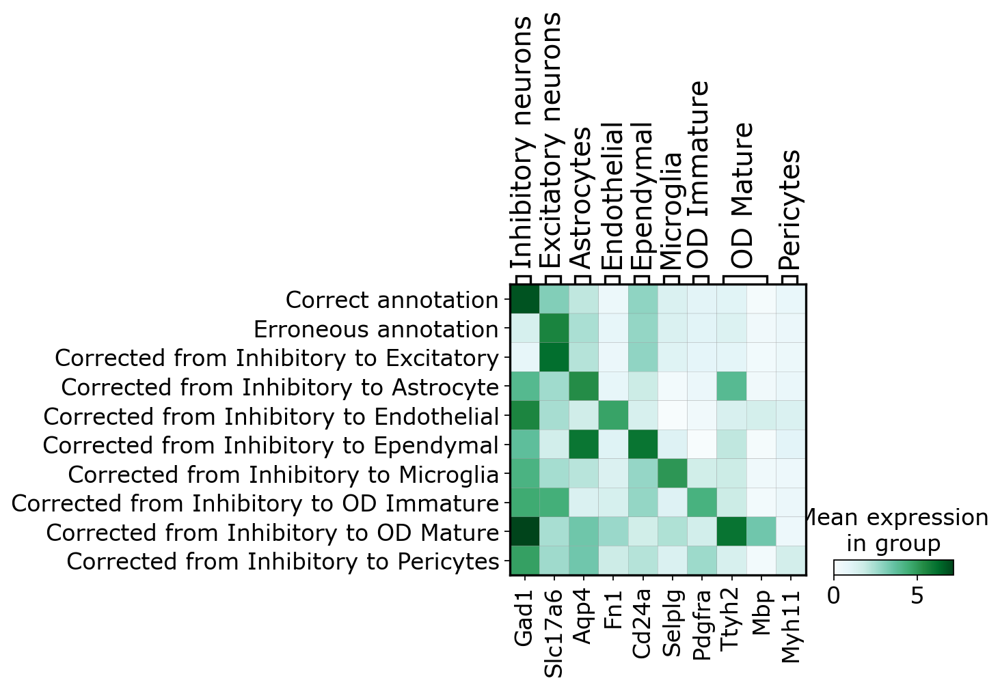

In [50]:
tmp_tdata2 = hdata[hdata.obs['CellType'].isin(['Inhibitory'])]
False_or_pos = []
for i in range(tmp_tdata2.n_obs):
    if tmp_tdata2.obs['conf_binaries'][i]:
        False_or_pos.append('  Correct annotation')
    else:
        False_or_pos.append('  Erroneous annotation')

tmp_tdata2.obs['Celltype_to_corrected'] = False_or_pos


Celltype_to_corrected =[]
for i in range(adata_false_annotated.n_obs):
    string = str(adata_false_annotated.obs['CellType'][i]) + "_" + str(adata_false_annotated.obs['CorrectedCellType'][i])
    Celltype_to_corrected.append(string)
adata_false_annotated.obs['Celltype_to_corrected'] = Celltype_to_corrected

tmp_tdata = adata_false_annotated[adata_false_annotated.obs['CellType'].isin(['Inhibitory'])]
Celltype_to_corrected =[]
for i in range(tmp_tdata.n_obs):
        if tmp_tdata.obs['conf_binaries'][i]==False:        
            if tmp_tdata.obs['CorrectedCellType'][i]=='Inhibitory': 
                string = " Corrected from " + str(tmp_tdata.obs['CellType'][i]) + " to " + str(tmp_tdata.obs['CorrectedCellType'][i])
            elif tmp_tdata.obs['CorrectedCellType'][i]=='Excitatory': 
                string = " Corrected from " + str(tmp_tdata.obs['CellType'][i]) + " to " + str(tmp_tdata.obs['CorrectedCellType'][i])
            else:
                string = "Corrected from " + str(tmp_tdata.obs['CellType'][i]) + " to " + str(tmp_tdata.obs['CorrectedCellType'][i])
            Celltype_to_corrected.append(string)

tmp_tdata.obs['Celltype_to_corrected'] = Celltype_to_corrected

marker_genes_dict = {
                     'Inhibitory neurons':['Gad1'],#, 'Gad2', 'Slc32a1'],
                    'Excitatory neurons': ['Slc17a6'],
                     'Astrocytes': ['Aqp4'],
                     'Endothelial':['Fn1'],
                     'Ependymal':['Cd24a'],
                     'Microglia':['Selplg'],
                     'OD Immature': ['Pdgfra'],
                     'OD Mature':['Ttyh2','Mbp'],
                     'Pericytes':['Myh11']}


tmp_tdata3 = tmp_tdata2.concatenate(tmp_tdata)



ax = sc.pl.matrixplot(tmp_tdata3, marker_genes_dict, groupby='Celltype_to_corrected', cmap='BuGn')


In [57]:
tmp_tdata.obs['CorrectedCellType'].value_counts()

Inhibitory     251
Astrocyte       18
OD Mature       12
OD Immature     10
Endothelial      8
Microglia        7
Ependymal        5
Pericytes        3
Name: CorrectedCellType, dtype: int64

In [39]:
adata_annotation_changed

View of AnnData object with n_obs × n_vars = 1138 × 161
    obs: 'Cell_ID', 'Animal_ID', 'Animal_sex', 'Behavior', 'Bregma', 'Centroid_X', 'Centroid_Y', 'Cell_class', 'Neuron_cluster_ID', 'batch', 'n_counts', 'CellType', 'var', 'conf', 'modified_label', 'conf_binaries', 'annotation', 'CorrectedCellType', 'changed_anno'
    uns: 'Cell_class_colors', 'log1p', 'pca', 'neighbors', 'umap', 'CellType_colors'
    obsm: 'spatial', 'spatial3d', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [40]:
def print_all_mean_expressions(adata,genes_list,label):
    annotations_list = adata.obs[label].unique()
    for gene in genes_list:
        for annotation in annotations_list:
            print("Mean expression of " + gene +" in " + annotation)
            print(get_mean_expression(adata, gene, label,annotation))
def get_mean_expression(adata, gene, label,annotation):
    adata_tmp = (adata[adata.obs[label].isin([annotation])])
    mean_expression = float(np.mean(adata_tmp[:, gene].X.toarray()))
    return mean_expression


In [41]:
print_all_mean_expressions(adata_annotation_changed,marker_genes_list,'CorrectedCellType')

Mean expression of Gad1 in Microglia
3.5202815532684326
Mean expression of Gad1 in Inhibitory
6.795059680938721
Mean expression of Gad1 in Excitatory
0.8562927842140198
Mean expression of Gad1 in Astrocyte
2.3118464946746826
Mean expression of Gad1 in Endothelial
3.177309513092041
Mean expression of Gad1 in Pericytes
2.3283591270446777
Mean expression of Gad1 in OD Immature
4.049413681030273
Mean expression of Gad1 in Ependymal
1.8505523204803467
Mean expression of Gad1 in OD Mature
4.396156311035156
Mean expression of Slc17a6 in Microglia
2.2384841442108154
Mean expression of Slc17a6 in Inhibitory
1.7158007621765137
Mean expression of Slc17a6 in Excitatory
6.165866851806641
Mean expression of Slc17a6 in Astrocyte
2.2557597160339355
Mean expression of Slc17a6 in Endothelial
1.9340795278549194
Mean expression of Slc17a6 in Pericytes
1.8125602006912231
Mean expression of Slc17a6 in OD Immature
4.213374614715576
Mean expression of Slc17a6 in Ependymal
1.4742894172668457
Mean expression of

In [42]:
print_all_mean_expressions(adata_false_annotation,marker_genes_list,'CellType')

Mean expression of Gad1 in Inhibitory
1.458528995513916
Mean expression of Gad1 in Excitatory
6.194403171539307
Mean expression of Gad1 in Astrocyte
2.857940435409546
Mean expression of Gad1 in Endothelial
2.369589328765869
Mean expression of Gad1 in OD Mature
3.2806830406188965
Mean expression of Gad1 in OD Immature
2.1531431674957275
Mean expression of Gad1 in Microglia
2.808074474334717
Mean expression of Gad1 in Ependymal
5.402202129364014
Mean expression of Slc17a6 in Inhibitory
5.608383655548096
Mean expression of Slc17a6 in Excitatory
1.9613548517227173
Mean expression of Slc17a6 in Astrocyte
2.568058967590332
Mean expression of Slc17a6 in Endothelial
1.8924345970153809
Mean expression of Slc17a6 in OD Mature
1.3944091796875
Mean expression of Slc17a6 in OD Immature
2.585217237472534
Mean expression of Slc17a6 in Microglia
1.9608922004699707
Mean expression of Slc17a6 in Ependymal
4.029361724853516
Mean expression of Myh11 in Inhibitory
0.5933344960212708
Mean expression of Myh1

In [43]:
print_all_mean_expressions(adata_true_annotation,marker_genes_list,'CellType')

Mean expression of Gad1 in OD Mature
1.5043890476226807
Mean expression of Gad1 in OD Immature
4.552657127380371
Mean expression of Gad1 in Inhibitory
6.8307085037231445
Mean expression of Gad1 in Excitatory
2.836520195007324
Mean expression of Gad1 in Microglia
2.5812089443206787
Mean expression of Gad1 in Astrocyte
2.681107997894287
Mean expression of Gad1 in Endothelial
2.1846938133239746
Mean expression of Gad1 in Pericytes
1.7570804357528687
Mean expression of Gad1 in Ependymal
0.9750598669052124
Mean expression of Slc17a6 in OD Mature
1.0711625814437866
Mean expression of Slc17a6 in OD Immature
2.9335432052612305
Mean expression of Slc17a6 in Inhibitory
3.1126997470855713
Mean expression of Slc17a6 in Excitatory
6.130898952484131
Mean expression of Slc17a6 in Microglia
1.9989134073257446
Mean expression of Slc17a6 in Astrocyte
2.125729560852051
Mean expression of Slc17a6 in Endothelial
1.4285348653793335
Mean expression of Slc17a6 in Pericytes
1.3610037565231323
Mean expression o

In [ ]:
print((" ").astype(int))